In [1]:
import numpy as np
import matplotlib.pyplot as plt
import healpy as hp
from astropy.io import fits
from astropy.utils.data import get_pkg_data_filename
import functions as f
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format ='retina'


#### Importing the Planck15 Raw CMB data from https://irsa.ipac.caltech.edu/data/Planck/release_2/all-sky-maps/

In [2]:
CMB_map_names = ["LFI_SkyMap_030_1024_R2.01_full.fits",
                 "LFI_SkyMap_044_1024_R2.01_full.fits" ,
                 "LFI_SkyMap_070_1024_R2.01_full.fits",
                 "HFI_SkyMap_100_2048_R2.02_full.fits", 
                 "HFI_SkyMap_143_2048_R2.02_full.fits",
                 "HFI_SkyMap_217_2048_R2.02_full.fits", 
                 "HFI_SkyMap_353_2048_R2.02_full.fits", 
                 "HFI_SkyMap_545_2048_R2.02_full.fits", 
                 "HFI_SkyMap_857_2048_R2.02_full.fits",];

In [296]:
CMB_maps = []
for i in CMB_map_names:
    
    temp = hp.read_map("../CMB_maps/%s"%(i))
    temp2 = hp.pixelfunc.ud_grade(temp, 512, order_in='RING') #to have the same resolution for all maps
    CMB_maps.append(temp2*10**6)

NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 1024
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING
NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT
Ordering converted to RING


#### Raw data maps for all 9 frequencies


0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.
0.0 180.0 -180.0 180.0
The inter

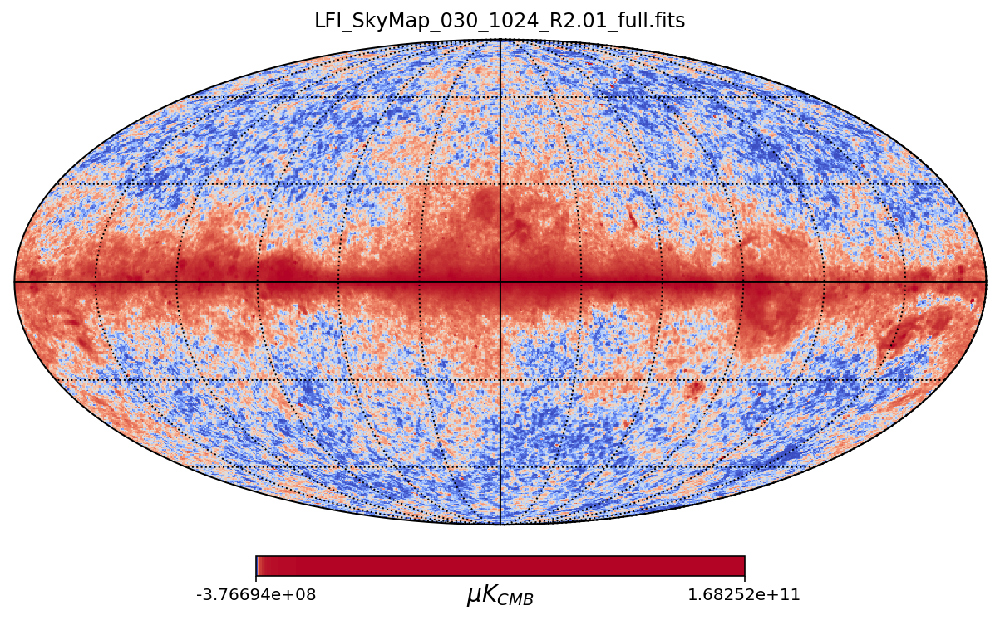

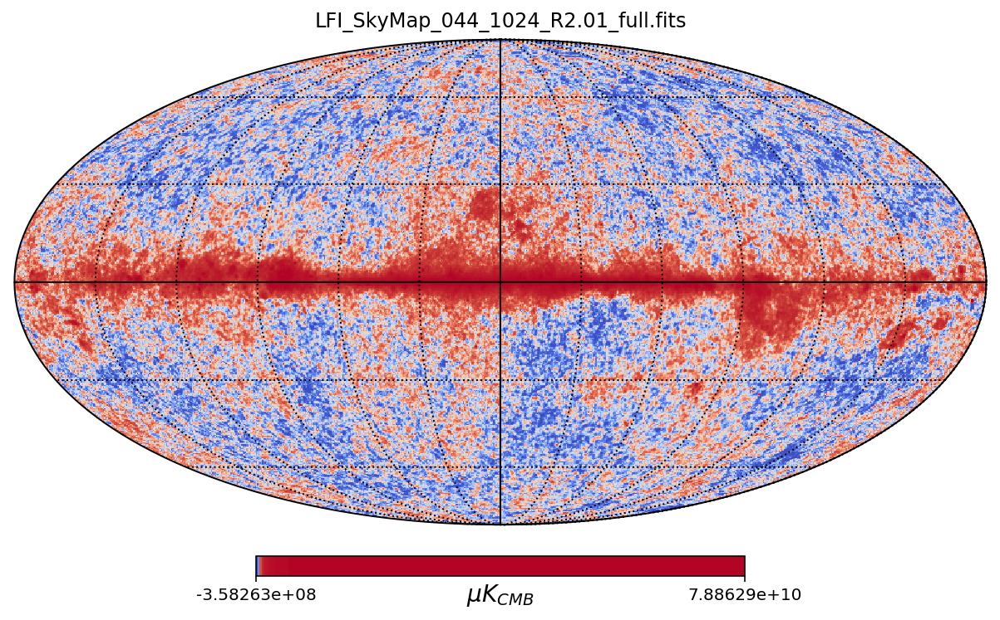

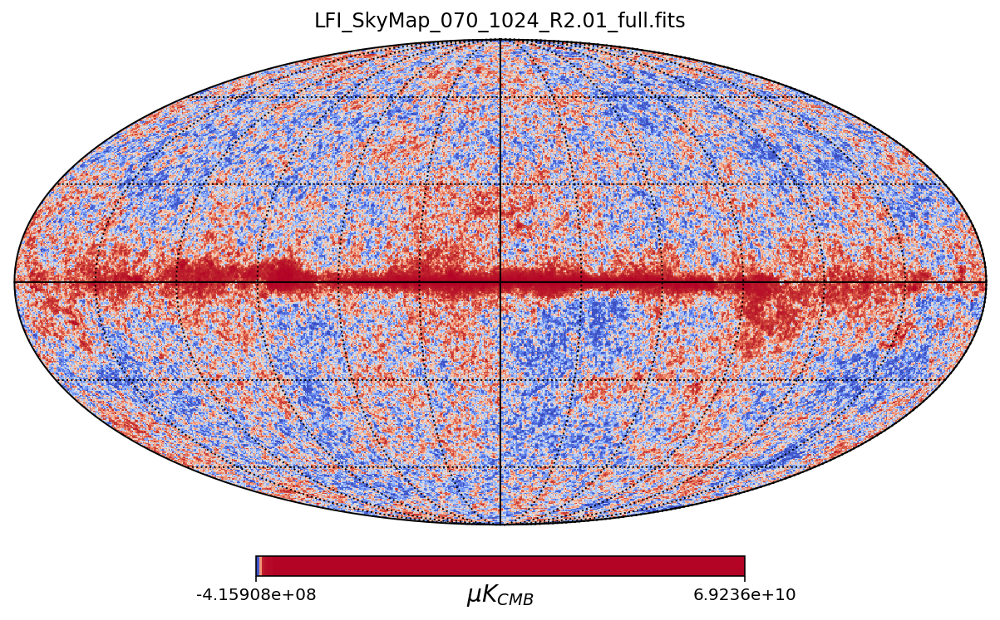

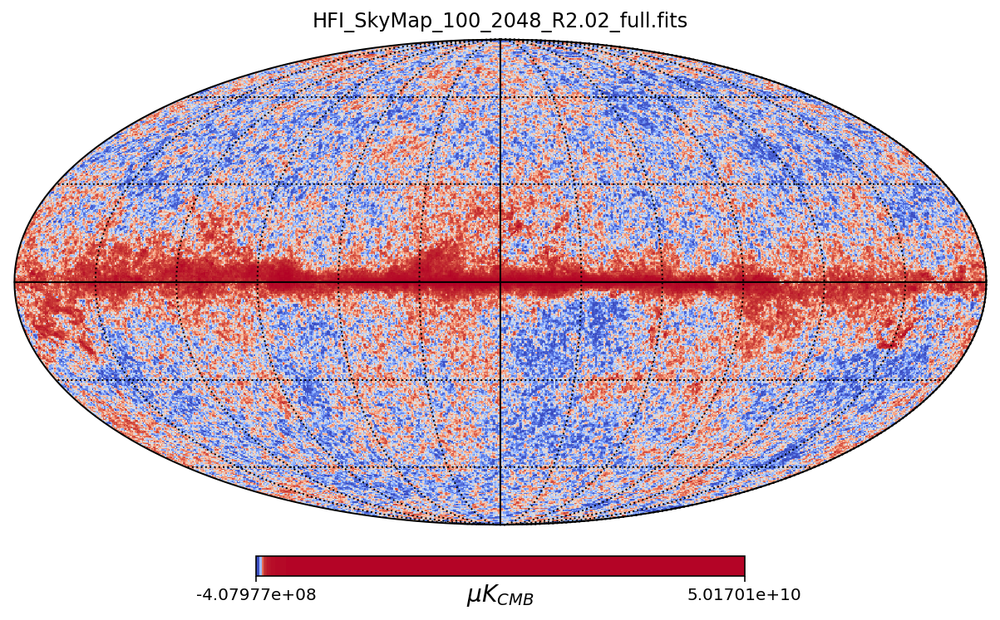

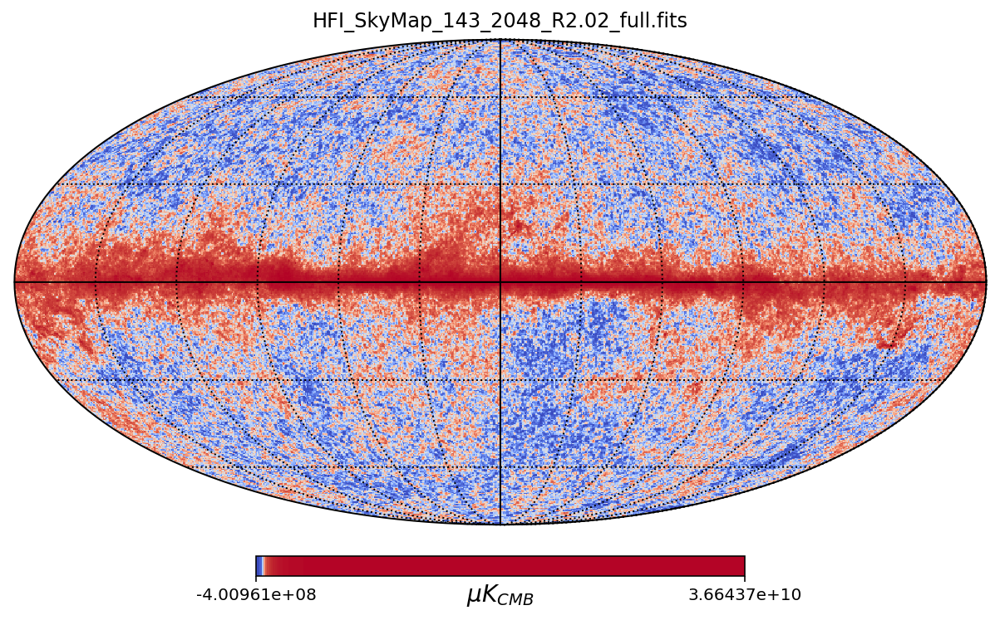

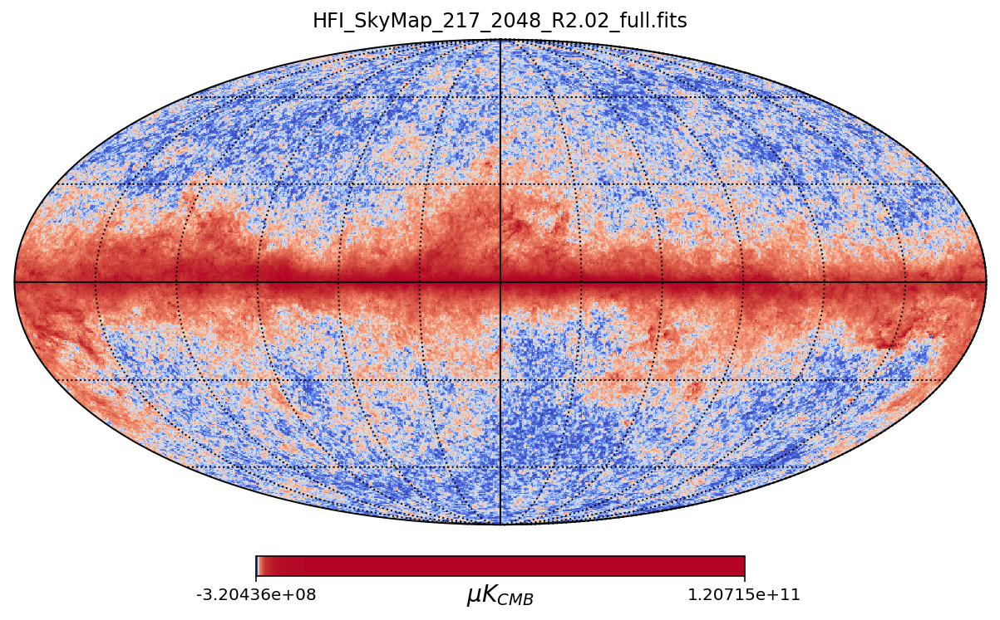

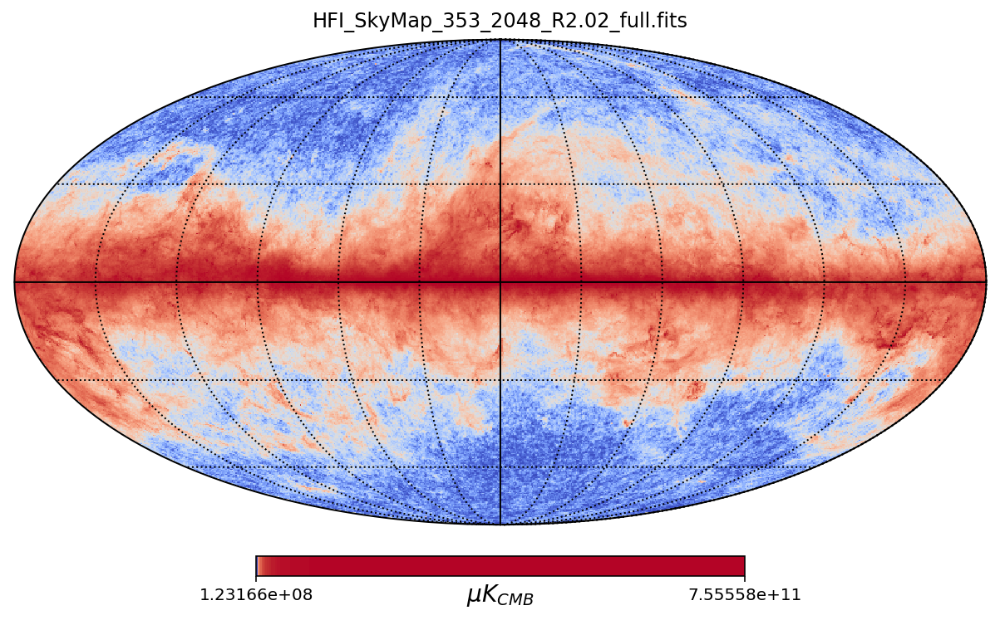

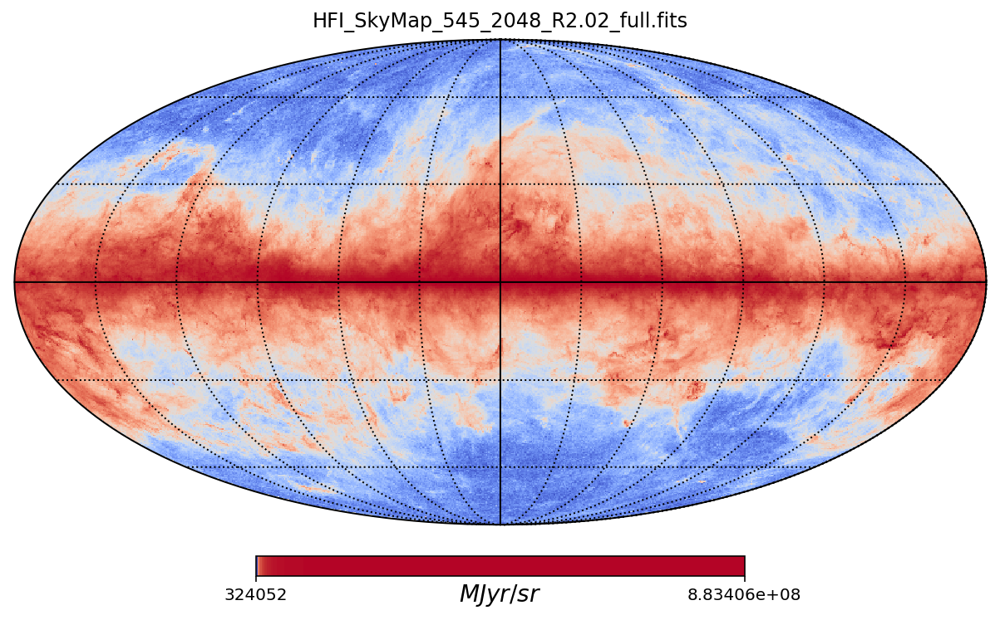

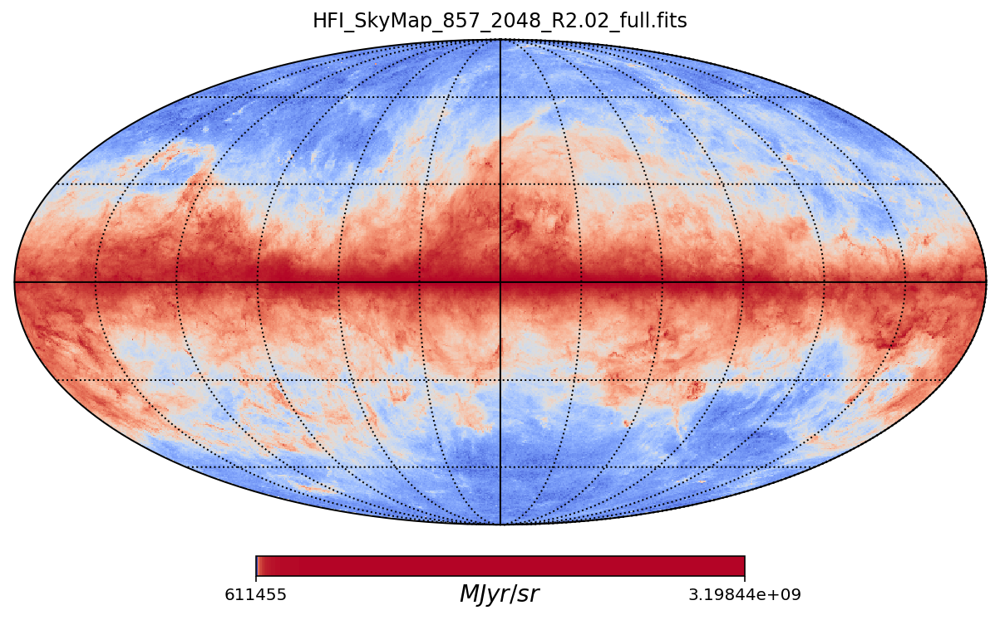

In [297]:
u = r"$\mu K_{CMB}$"
u2 = r"$MJyr/sr$"
for i in range(len(CMB_maps)):
    if i < 7 :
        hp.mollview( (10**6)*CMB_maps[i], unit= u ,norm="hist", title=CMB_map_names[i], cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )
    else: 
        hp.mollview( CMB_maps[i], unit= u2 ,norm="hist", title=CMB_map_names[i], cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )
        
    hp.graticule()


## Data Analysis
#### First, a few important things:
the signal is given in different units depending on the band : "The signal is given in units of Kcmb for 30-353 GHz, or MJy/sr (for a constant νFν energy distribution ) for 545 and 857 GHz." Hence we need to convert the 2 highest bands to the units $K_{cmb}$.

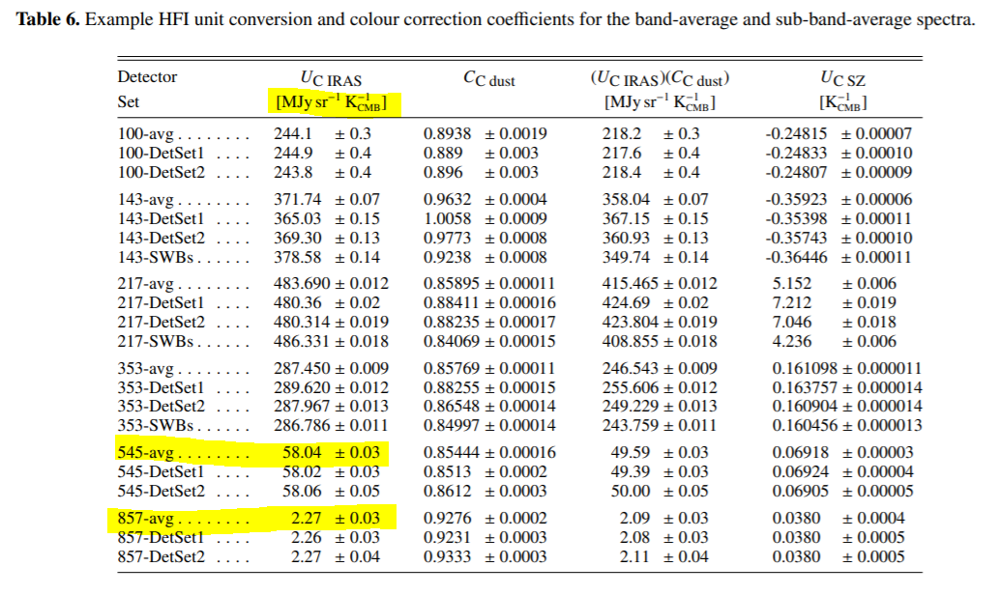

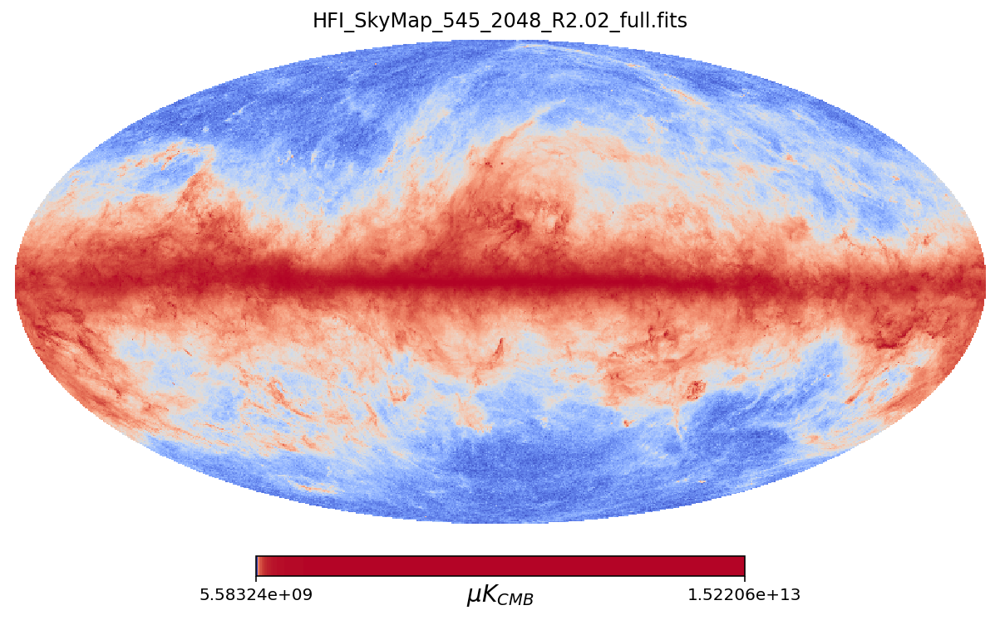

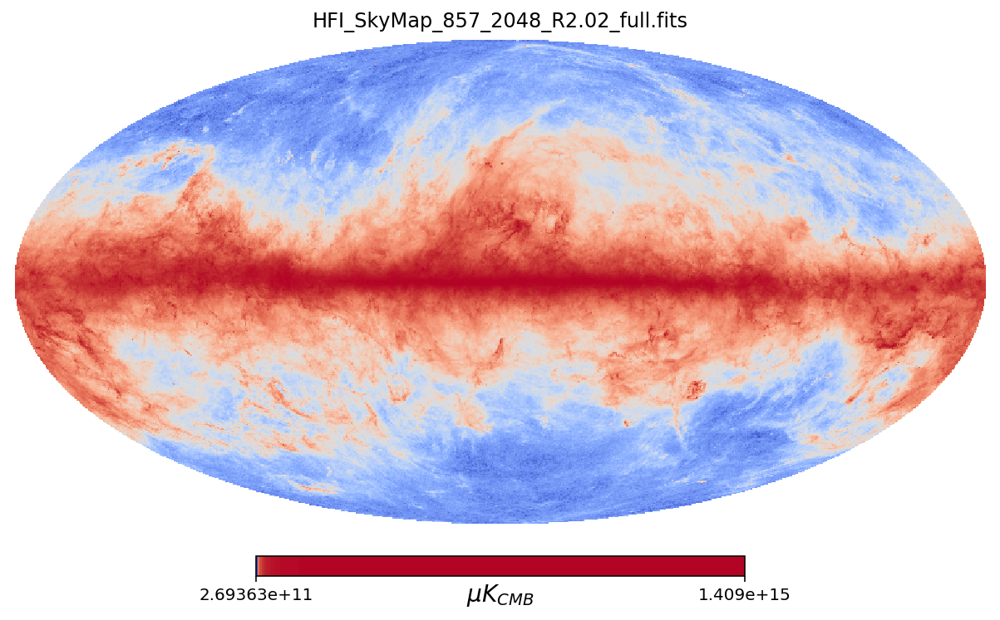

In [298]:
# the diff frequencies
freq = [30,44,70,100,143,217,353,545,857]

#the HFI where not obtained in the same units as the LFI, there exist some conversion factors:
conv_factors = [1/58.04,1/2.27]

CMB_maps_cor =[]
for i in range(2):
    #convert
    CMB_maps_cor.append(conv_factors[i]*CMB_maps[7+i])

    #visualize
    hp.mollview( (10**6)*CMB_maps_cor[i], unit = u ,norm="hist", title=CMB_map_names[i+7], cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )


In [299]:
#doing Tegmark paper's determination of regions
#step 1
%autoreload 2
CMB_maps[7] = CMB_maps_cor[0]
CMB_maps[8] = CMB_maps_cor[1]


diff_maps = []
for i in range(len(CMB_maps)-1):
    diff_maps.append(CMB_maps[i]-CMB_maps[1+i])
    
#step 2
abs_diff_maps = np.abs(np.transpose(diff_maps))
junk_map = np.array([np.max(i) for i in abs_diff_maps])

#code to downsample the junk_map
#junk_map = hp.pixelfunc.ud_grade(junk_map, 64)
#junk_map = hp.pixelfunc.ud_grade(junk_map, 512)

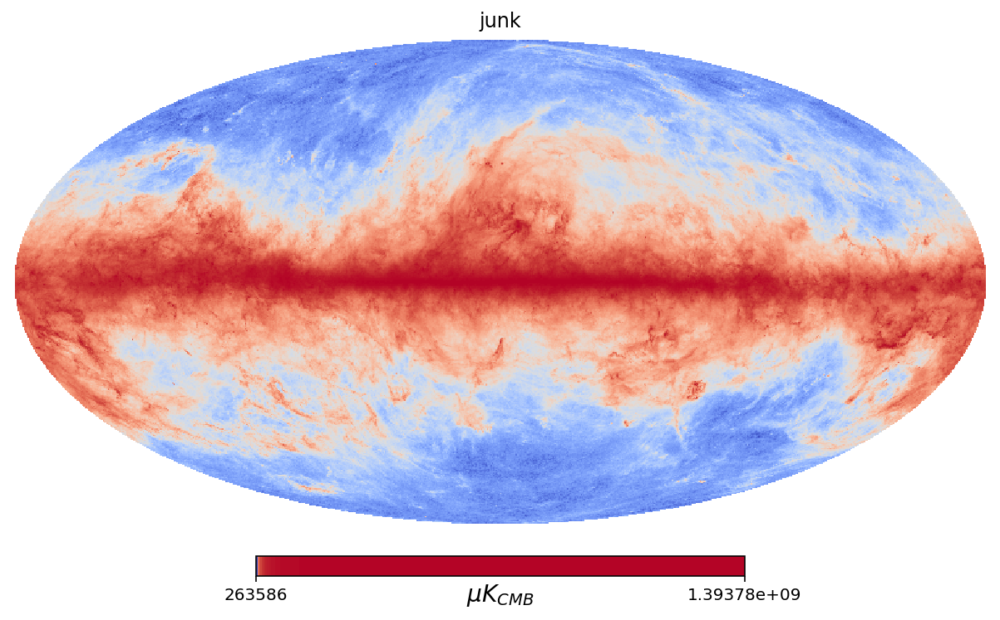

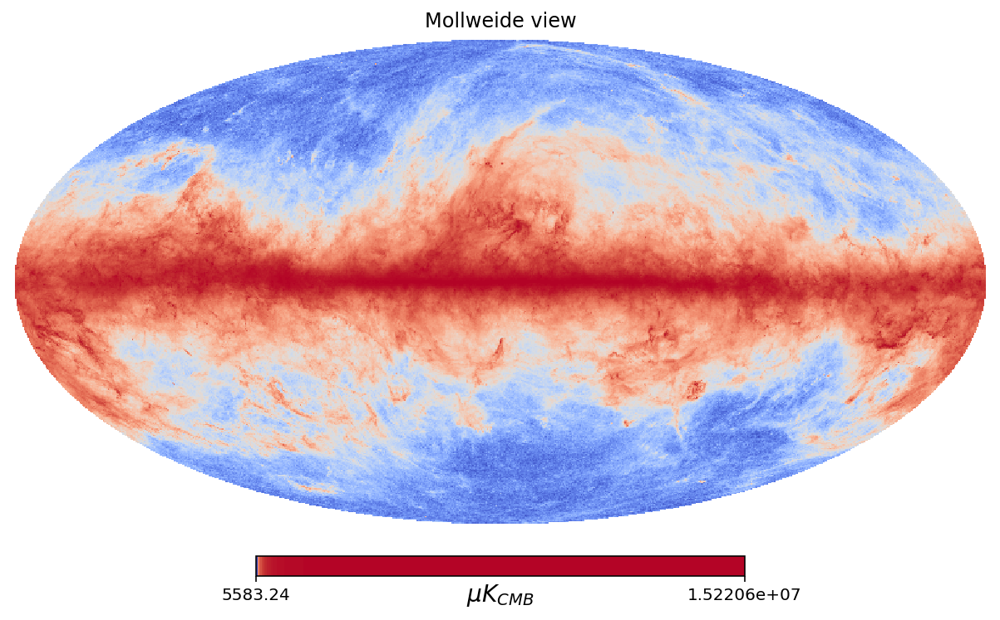

In [300]:
#comparing junk map to 800-band map
hp.mollview( junk_map, unit= u ,norm="hist", title='junk', cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )
hp.mollview( (CMB_maps_cor[1] - junk_map), unit= u ,norm="hist", cmap = 'coolwarm'
                 #min=-1,
                 #max=1,
                 )

### Region Finding (based on junk map)

the bin edges aka regions [2.53674752e+05 6.18685788e+05 1.50890895e+06 3.68006875e+06
 8.97529697e+06 2.18897965e+07 5.33868896e+07 1.30204956e+08
 3.17556064e+08 7.74485527e+08 1.88888798e+09 4.60679724e+09]


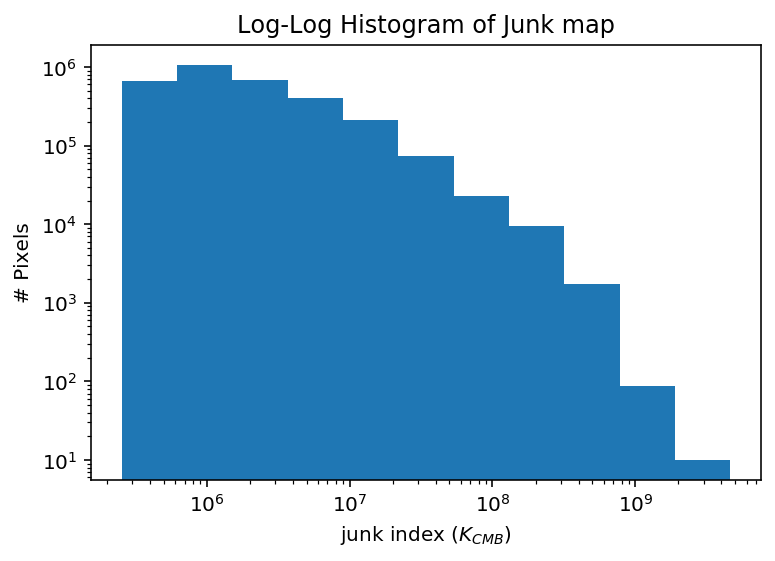

In [8]:
#finding the edges of our hist
number_bins = 12
chosen_map = junk_map
low_edge = np.min(chosen_map)
high_edge = np.max(chosen_map)
log_bins = np.logspace(np.log10(low_edge),np.log10(high_edge), number_bins)

#plotting a log hist to find the regions
plt.hist(chosen_map, bins=log_bins,log=True);
plt.title('Log-Log Histogram of Junk map')
plt.semilogx()
plt.xlabel('junk index ($K_{CMB}$)')
plt.ylabel('# Pixels')
print('the bin edges aka regions',log_bins)

In [9]:
#regions for the boolean mask making code
#grouping some of the larger bins together
#log_bins_modified = np.copy(log_bins)[:9]
#log_bins_modified[-1] = log_bins[-1]
regions = f.bins_to_regions(log_bins)


In [10]:
#splitting boolean map created from junk map
boolean_template, cut_junk_map = f.splitting_step1(regions,chosen_map)

#code to use if you only want to see one region
#boolean_template, cut_junk_map = f.splitting_step1(np.array([[np.min(junk_map)-1, np.max(junk_map)+1]]),junk_map)

In [11]:
#cutting all maps
cuts = []

for i in range(len(CMB_maps)):
    cuts.append(f.splitting_step2(boolean_template, CMB_maps[i]))

In [12]:
#visualizing the region splitting on the 30 GHz map
regions_vis = []
for i in range(len(boolean_template)):
    regions_vis.append(f.map_and_mask(boolean_template[i], CMB_maps[-1]))

In [13]:
#computing different weights for each region of the cut maps
weights = []
#cuts_region is an array of regions, where each region contains the data from each frequency channel
cuts_region = np.transpose(cuts)
for i in range(len(cuts_region)):
    weights.append(f.compute_weights(cuts_region[i]))
    
#code for weighting a single region
#weights = [f.compute_weights(cuts_region)]


In [14]:
#making the weighted maps for each region, but not yet cutting them up
uncut_weighted_regions = []
for i in range(len(weights)):
    uncut_weighted_regions.append(f.weight_freqs(weights[i], CMB_maps))

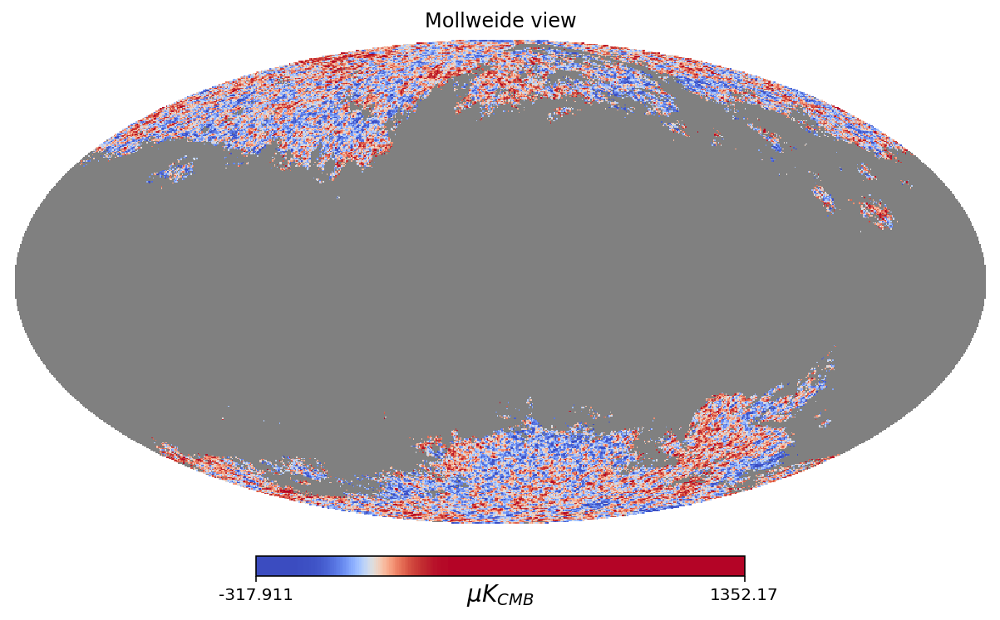

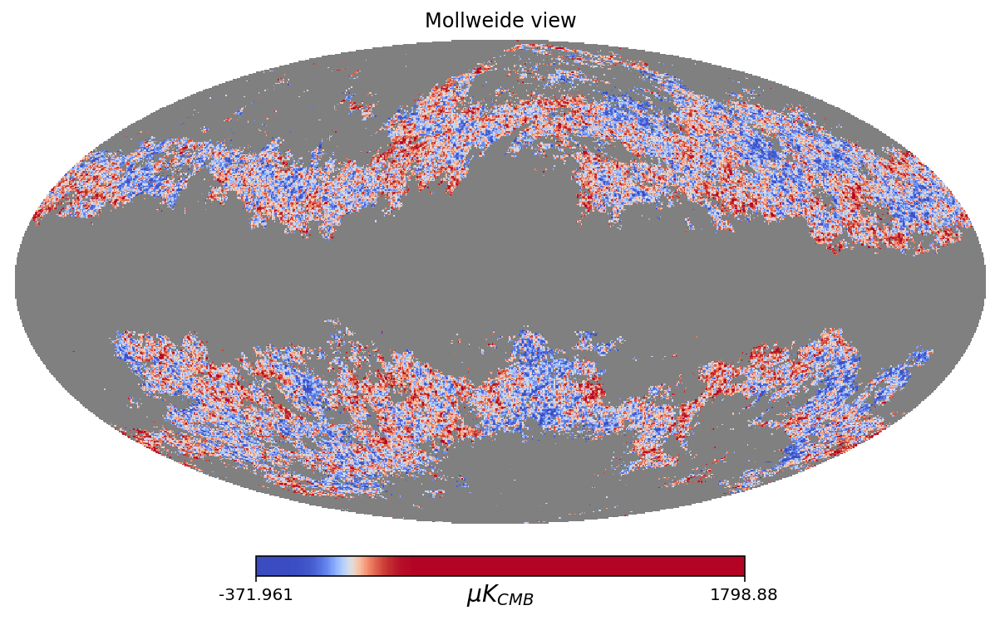

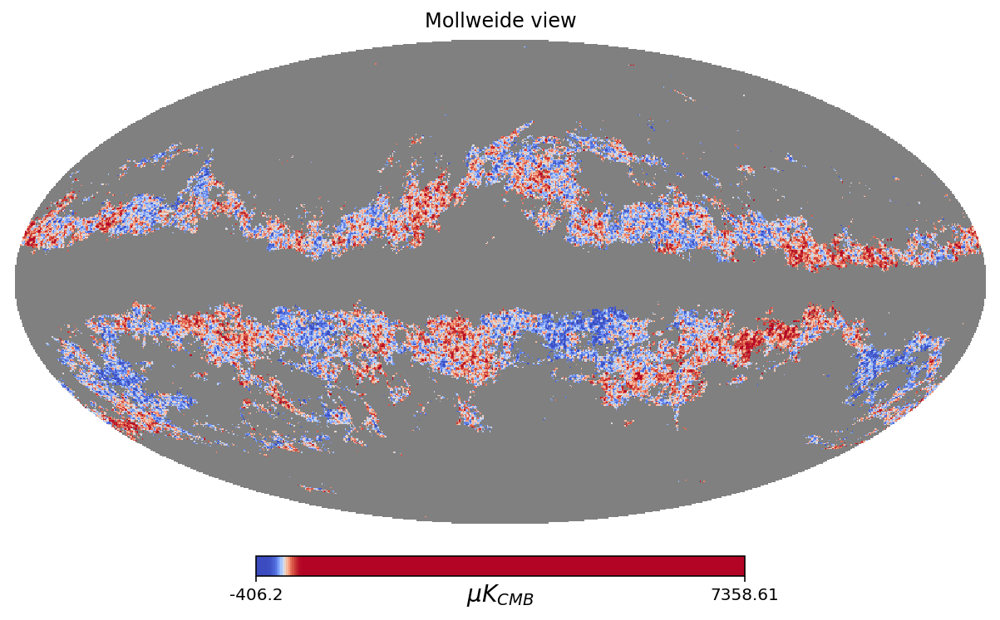

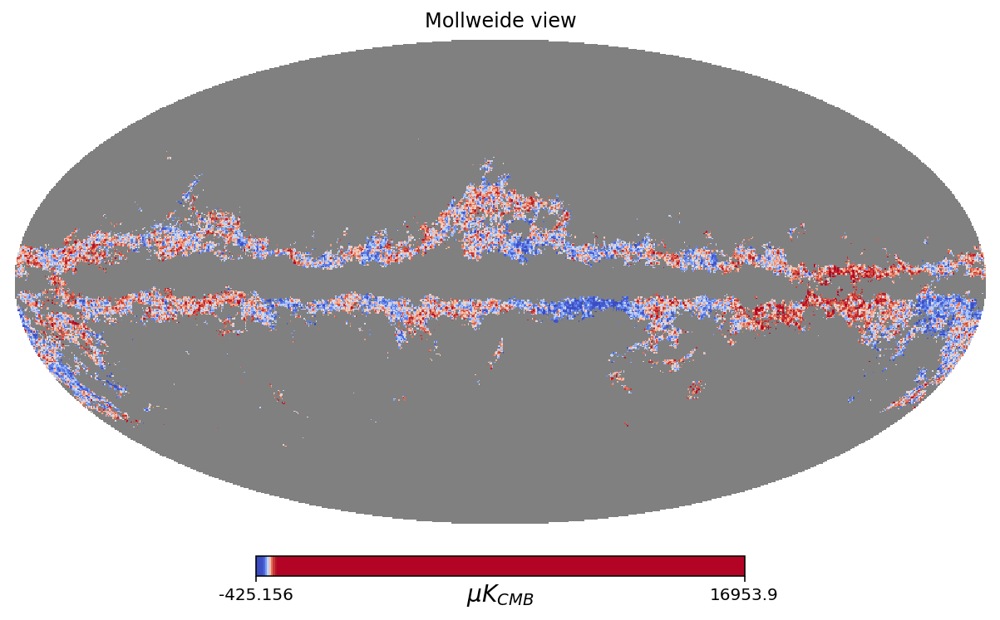

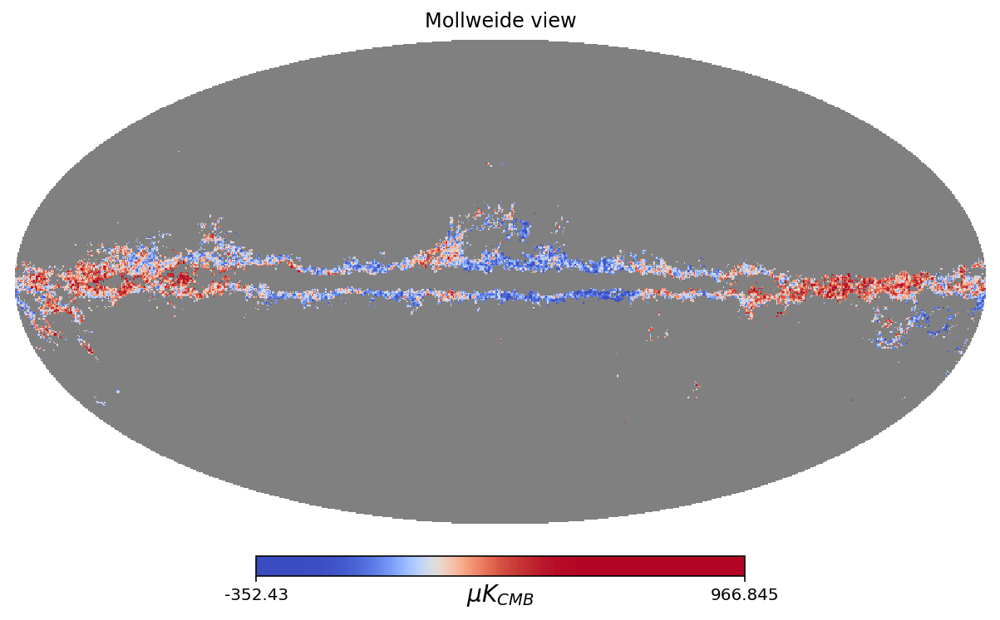

...

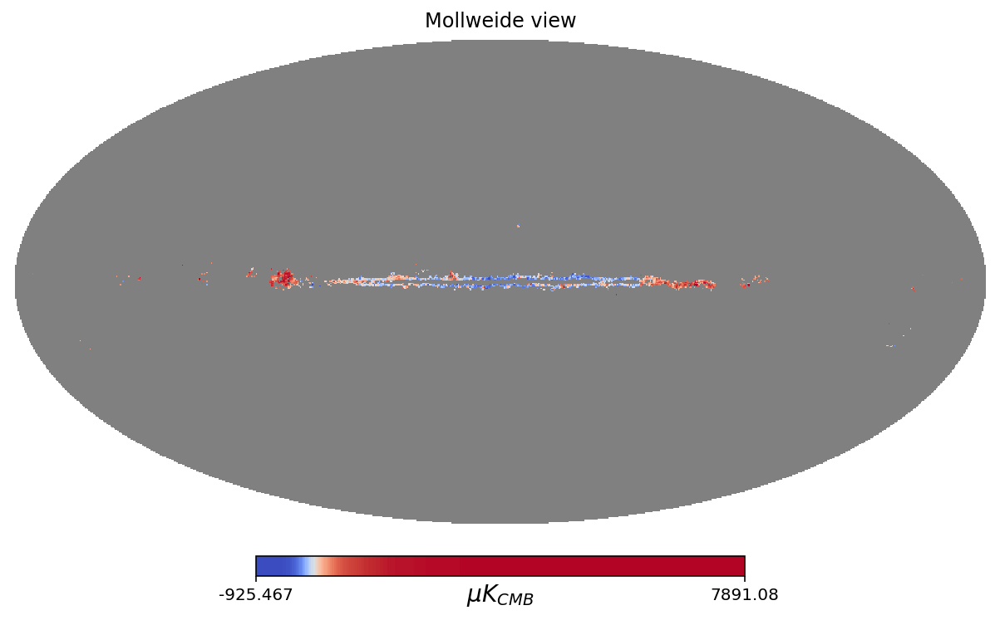

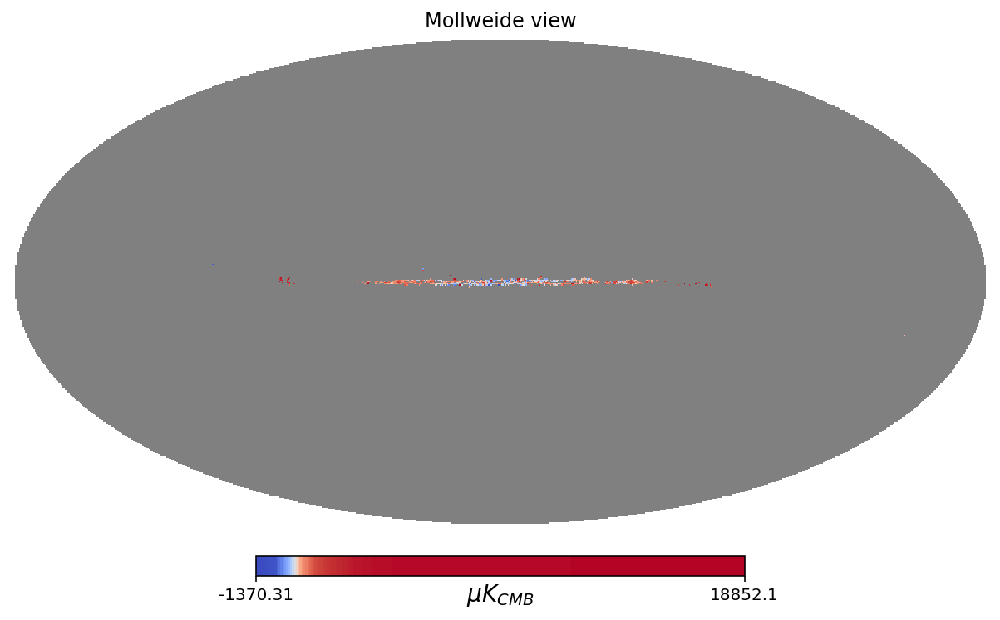

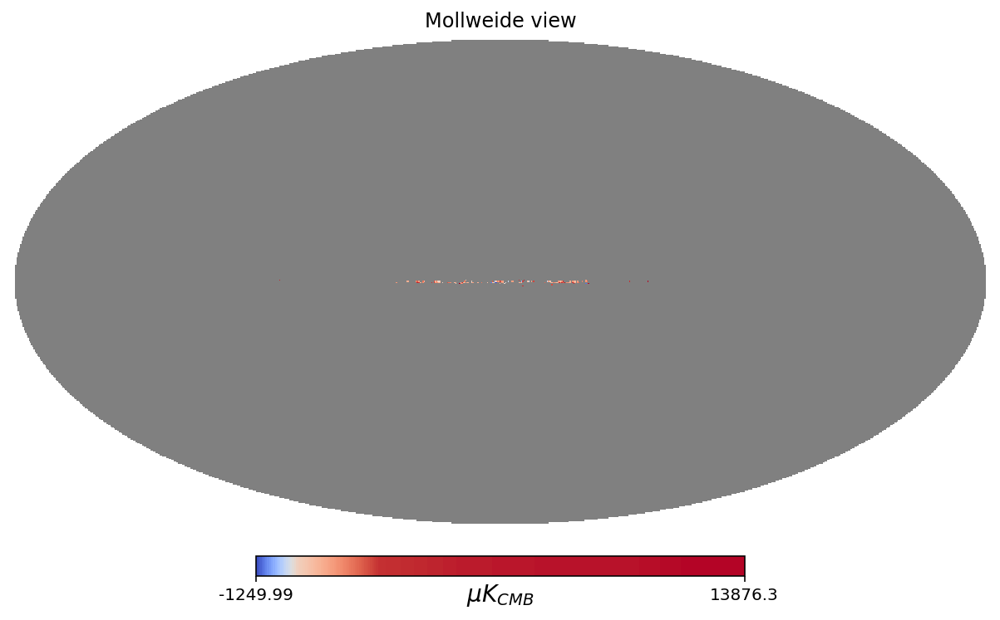

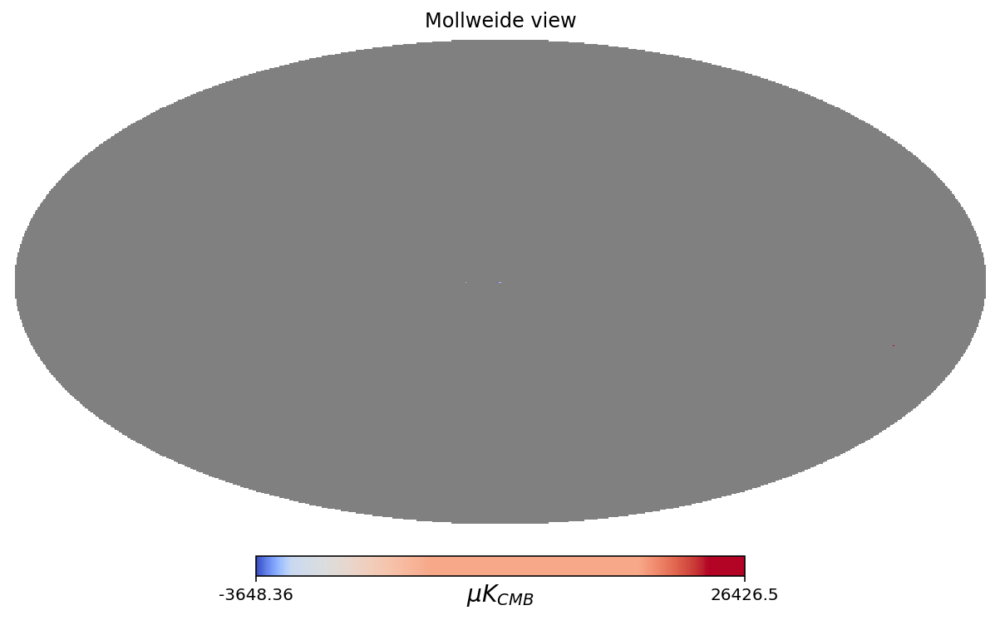

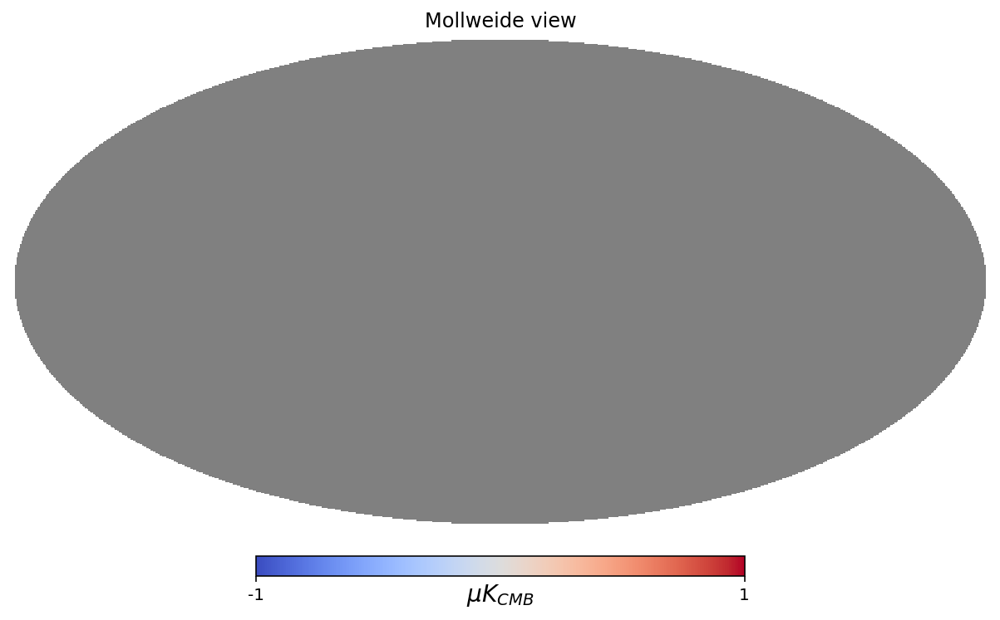

In [15]:
temp_map = []
for i in range(len(boolean_template)):
    temp_map = f.weight_freqs(weights[i], CMB_maps)
    to_plot = f.map_and_mask(boolean_template[i], temp_map)
    hp.mollview(to_plot,unit=u,norm="hist",cmap = 'coolwarm')

In [16]:
#setting the areas outside of regions to zero if the weights don't apply to that region and combining into one map
final_CMB_map = f.recombine_maps(uncut_weighted_regions, boolean_template)

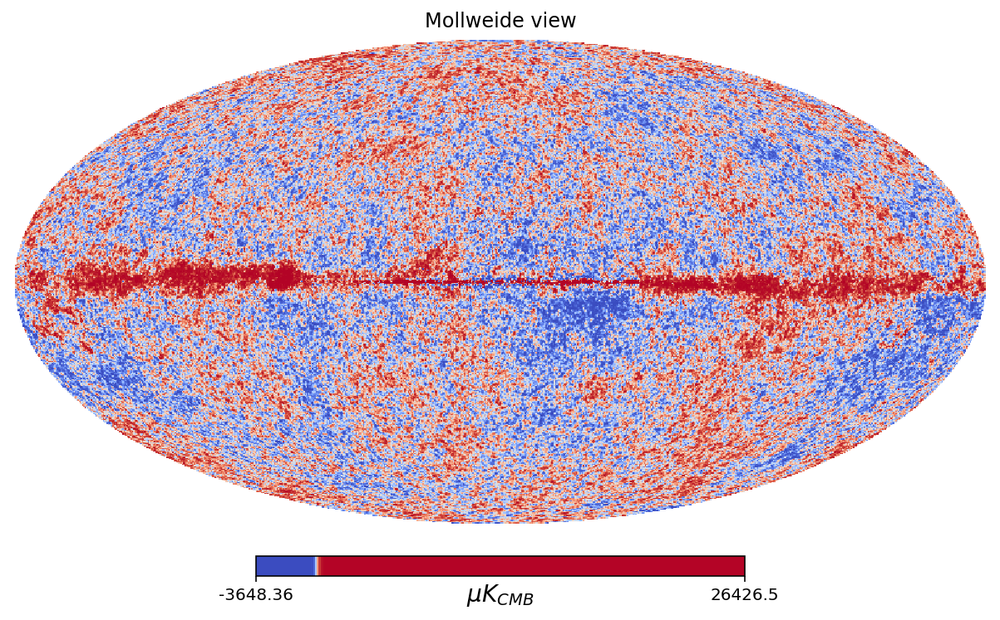

In [17]:
hp.mollview(final_CMB_map, unit = u,norm="hist", cmap = 'coolwarm')


### Part 2

In [19]:
'''alms = []
max_l = 1024
for i in range(len(boolean_template)):
    alms.append(hp.sphtfunc.map2alm(region,lmax = max_l))

def cross_power_matrix(alm_array):
    c_ij = []
    for i in range(len(alm_array)):
        alm_array_conj = np.conj(alm_array[i])
        prod = []
        for l in range(len(alm_array[i])):
            prod.append(np.real(alm_array[i][l] * alm_array_conj[len(alm_array[i])-1-l]))
        c_ij.append(np.average(prod[-1]))
    return c_ij
clm_ish = hp.sphtfunc.alm2cl(alms)
clm_ish.shape
c_ij_ish = []
for i in range(len(clm_ish)):
    c_ij_ish.append(np.average(clm_ish[i]))
len(c_ij_ish)
c_matrix = np.empty((9,9))
           
for i in range(9):
    for j in range(i,9-i):
        c_matrix[i][j] = c_ij_ish[j+i]
    if(not (i==j)):
        c_matrix[j][i] = c_matrix[i][j]
c_matrix.shape
unit_vec = np.ones(9)
cinv = np.linalg.inv(c_matrix)
    
weights = (cinv @ unit_vec)/(np.transpose(unit_vec) @ cinv @ unit_vec )
np.sum(weights)
print(weights)
b= f.weight_freqs(weights,CMB_maps)
hp.mollview(b*1e-6, norm="hist", cmap = 'coolwarm')'''

    

'alms = []\nmax_l = 1024\nfor i in range(len(boolean_template)):\n    alms.append(hp.sphtfunc.map2alm(region,lmax = max_l))\n\ndef cross_power_matrix(alm_array):\n    c_ij = []\n    for i in range(len(alm_array)):\n        alm_array_conj = np.conj(alm_array[i])\n        prod = []\n        for l in range(len(alm_array[i])):\n            prod.append(np.real(alm_array[i][l] * alm_array_conj[len(alm_array[i])-1-l]))\n        c_ij.append(np.average(prod[-1]))\n    return c_ij\nclm_ish = hp.sphtfunc.alm2cl(alms)\nclm_ish.shape\nc_ij_ish = []\nfor i in range(len(clm_ish)):\n    c_ij_ish.append(np.average(clm_ish[i]))\nlen(c_ij_ish)\nc_matrix = np.empty((9,9))\n           \nfor i in range(9):\n    for j in range(i,9-i):\n        c_matrix[i][j] = c_ij_ish[j+i]\n    if(not (i==j)):\n        c_matrix[j][i] = c_matrix[i][j]\nc_matrix.shape\nunit_vec = np.ones(9)\ncinv = np.linalg.inv(c_matrix)\n    \nweights = (cinv @ unit_vec)/(np.transpose(unit_vec) @ cinv @ unit_vec )\nnp.sum(weights)\nprint(we

## THIS WORKS :

In [301]:
c = [[1 for i in range(9)] for j in range(9)]
print(c)
for i in range(9):
    for j in range(i,9):
        print(i,j)
        #c[i][j] = np.mean(hp.sphtfunc.anafast(CMB_maps[i],CMB_maps[j], lmax=1024))
        c[i][j] = np.array(hp.sphtfunc.anafast(CMB_maps[i],CMB_maps[j], lmax=1024))
        if(not (i==j)):
            c[j][i] = c[i][j]

[[1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1], [1, 1, 1, 1, 1, 1, 1, 1, 1]]
0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
1 1
1 2
1 3
1 4
1 5
1 6
1 7
1 8
2 2
2 3
2 4
2 5
2 6
2 7
2 8
3 3
3 4
3 5
3 6
3 7
3 8
4 4
4 5
4 6
4 7
4 8
5 5
5 6
5 7
5 8
6 6
6 7
6 8
7 7
7 8
8 8


In [302]:
#transpose c map
c_trans = np.transpose(c)

In [303]:
weights_vec = []
unit_vec = np.ones(9)
for i in c_trans:
    cinv = np.linalg.inv(i)
    weights_vec.append((cinv @ unit_vec)/(np.transpose(unit_vec) @ cinv @ unit_vec ))

In [304]:
trans_weight = np.transpose(weights_vec)

In [305]:
alm_lis = []
for i in CMB_maps:
    alm_lis.append(hp.map2alm(i, lmax = 1024))
alm_lis

[array([ 1.34767238e+03+0.j        ,  1.10418614e-02+0.j        ,
        -1.25105959e+03+0.j        , ..., -2.89425444e-02+0.07058132j,
        -2.43252216e-02-0.00265897j, -1.39294712e-02-0.01289144j]),
 array([ 5.27493556e+02+0.j        , -1.14011065e+00+0.j        ,
        -4.35444335e+02+0.j        , ...,  2.08594721e-02+0.01868852j,
        -7.93890008e-02+0.0800461j , -1.00424278e-01-0.03242512j]),
 array([ 3.06575549e+02+0.j        ,  4.10015731e-01+0.j        ,
        -2.07299137e+02+0.j        , ...,  3.84958053e-01-0.76084239j,
        -3.65174206e-01+0.48270563j, -2.61025619e-03+0.1848814j ]),
 array([ 3.81548655e+02+0.j       , -1.46935137e+00+0.j       ,
        -3.10796870e+02+0.j       , ...,  3.07669663e-01-0.7758351j,
        -1.41798134e-01+0.6454737j,  1.36162767e-01+0.3348078j]),
 array([ 5.63005645e+02+0.j        , -5.12560932e+00+0.j        ,
        -4.30294523e+02+0.j        , ...,  6.12755744e-02-0.91504227j,
         4.52207521e-02+0.61523356j,  3.07424890e

In [333]:
weighted_alm = []
for i in range(len(alm_lis)):
    weighted_alm.append(hp.sphtfunc.almxfl(alm_lis[i], trans_weight[i]))

final_alm_cleaned = np.sum(weighted_alm,axis=0)

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


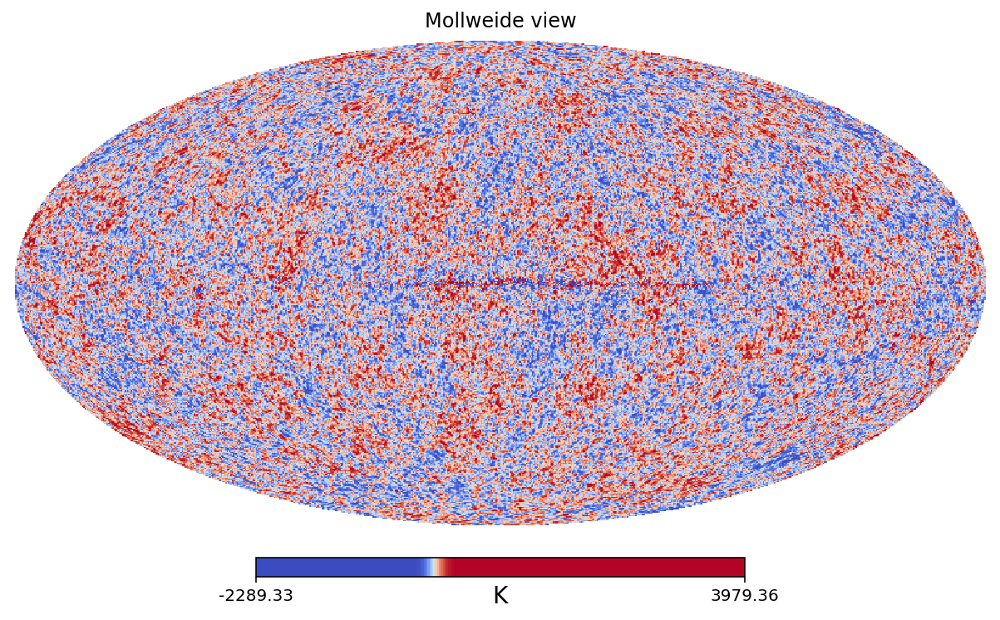

In [334]:
sphere_map_cleaned = hp.alm2map(clean,512)
hp.mollview(sphere_map_cleaned,unit="K", norm="hist",cmap="coolwarm")

In [331]:
c2 = hp.sphtfunc.anafast(sphere_map_cleaned,gal_cut=2)

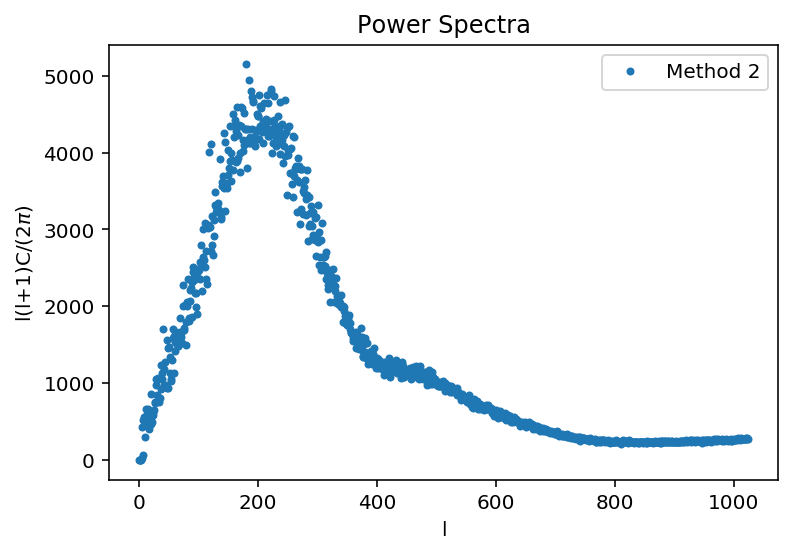

In [332]:
plt.plot(yaxis_pow_spec(c2), '.',label= 'Method 2')
plt.title('Power Spectra')
plt.xlabel('l')
plt.ylabel('l(l+1)C/(2$\pi$)')
plt.legend()

In [294]:
def yaxis_pow_spec(c, l=1025):
    p= []
    for i in range(l):
        p.append(i*(i+1)*c[i]/(2*np.pi))
    return p

In [15]:
weighted = []
for i in range(9):
    weighted.append(CMB_maps[i]*weights2[i])

In [16]:
final = np.sum(weighted, axis=0)

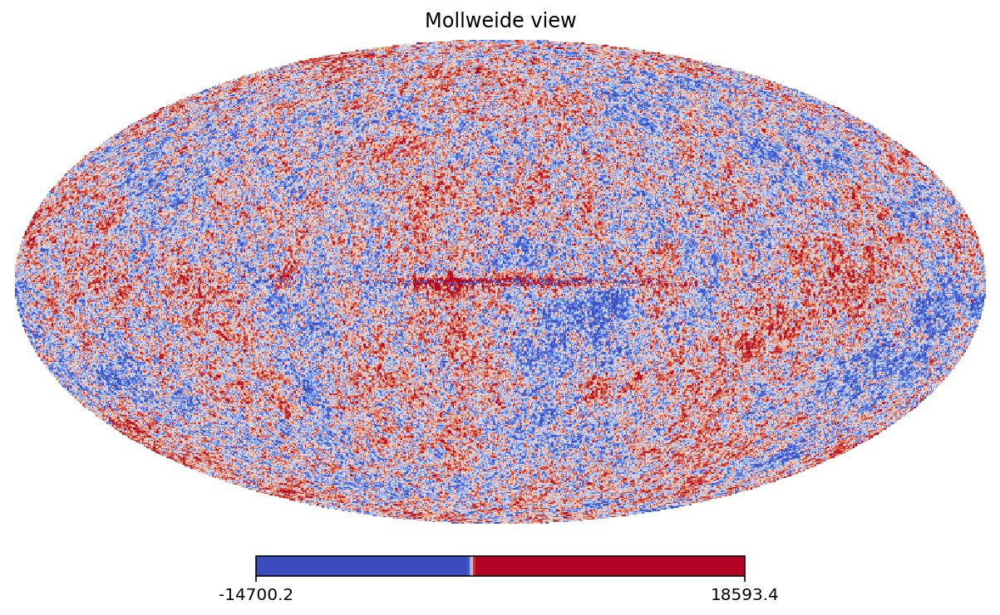

In [17]:
hp.mollview(final, norm="hist", cmap = 'coolwarm')